In [1]:
%cd /content/drive/MyDrive/Medical-Image-Segmentation/Code/data-science-bowl-2018

/content/drive/MyDrive/Medical-Image-Segmentation/Code/data-science-bowl-2018


In [2]:
from glob import glob
from collections import Counter
import pickle
import IPython.display as display
import matplotlib.pyplot as plt
import numpy as np
import datetime
import os

import PIL
import PIL.Image
from skimage.io import imread, imshow
from skimage.transform import resize

import tensorflow as tf
%load_ext tensorboard
import tensorflow.keras.backend as K

#For more information about autotune: https://www.tensorflow.org/guide/data_performance#prefetching
AUTOTUNE = tf.data.experimental.AUTOTUNE
print(f"Tensorflow ver. {tf.__version__}")

Tensorflow ver. 2.6.0


# Preparing Input Pipeline

* Reference https://yann-leguilly.gitlab.io/post/2019-12-14-tensorflow-tfdata-segmentation/

### Loading Data

In [3]:
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)

#Data Paths
TRAIN_PATH = 'data_custom/train/'
VAL_PATH = 'data_custom/val/'
TEST_PATH = 'data_custom/test/'

TRAIN_IDS = [x[:-4] for x in os.listdir(TRAIN_PATH +'images')]
VAL_IDS = [x[:-4] for x in os.listdir(VAL_PATH +'images')]
TEST_IDS = [x[:-4] for x in os.listdir(TEST_PATH +'images')]

print('example id:', TRAIN_IDS[0])
print('*'*50)
print('number of train instances', len(TRAIN_IDS))
print('number of val instances', len(VAL_IDS))
print('number of test instances', len(TEST_IDS))

example id: 0121d6759c5adb290c8e828fc882f37dfaf3663ec885c663859948c154a443ed
**************************************************
number of train instances 669
number of val instances 65
number of test instances 3019


In [4]:
with open('tensors/X_train','rb') as f: X_train = pickle.load(f)
with open('tensors/X_val','rb') as f: X_val = pickle.load(f)
with open('tensors/X_test','rb') as f: X_test = pickle.load(f)

with open('tensors/y_train','rb') as f: y_train = pickle.load(f)
with open('tensors/y_val','rb') as f: y_val = pickle.load(f)

In [5]:
print('train data shape', X_train.shape, y_train.shape)
print('val data shape', X_val.shape, y_val.shape)
print('test data shape', X_test.shape)

train data shape (669, 256, 256, 3) (669, 256, 256, 1)
val data shape (65, 256, 256, 3) (65, 256, 256, 1)
test data shape (3019, 256, 256, 3)


In [6]:
IMG_HEIGHT = 256
IMG_WIDTH = 256
IMG_CHANNELS = 3
N_CLASSES = 2

### tf.data pipeline

Final Flow

In [7]:
def augmentation(x, y):
  if tf.random.uniform(()) > 0.5:
      x = tf.image.flip_left_right(x)
      y = tf.image.flip_left_right(y)
  if tf.random.uniform(()) > 0.5:
      x = tf.image.flip_up_down(x)
      y = tf.image.flip_up_down(y)
  return x, y 

def normalization(x, y):
  x = tf.cast(x, tf.float32) / 255.0
  y = tf.cast(y, tf.float32) #mask is already in normalized form
  return x, y

In [8]:
BATCH_SIZE = 16

train_dataset = tf.data.Dataset.from_tensor_slices((X_train,y_train))
train_dataset = train_dataset.map(normalization, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(10000, reshuffle_each_iteration=True)
train_dataset = train_dataset.repeat()
train_dataset = train_dataset.map(augmentation, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.batch(BATCH_SIZE)
train_dataset = train_dataset.prefetch(tf.data.AUTOTUNE)

val_dataset = tf.data.Dataset.from_tensor_slices((X_val,y_val))
val_dataset = val_dataset.map(normalization, num_parallel_calls=tf.data.AUTOTUNE)
val_dataset = val_dataset.batch(BATCH_SIZE)
val_dataset = val_dataset.prefetch(tf.data.AUTOTUNE)

In [9]:
print(train_dataset)
print(val_dataset)

<PrefetchDataset shapes: ((None, 256, 256, 3), (None, 256, 256, 1)), types: (tf.float32, tf.float32)>
<PrefetchDataset shapes: ((None, 256, 256, 3), (None, 256, 256, 1)), types: (tf.float32, tf.float32)>


#### Sanity Check

In [10]:
steps = len(TRAIN_IDS) // BATCH_SIZE

for images, masks in train_dataset.take(5):
  for i in range(BATCH_SIZE):
    plt.figure(figsize=(12,12))
    plt.subplot(1, 2, 1)
    plt.imshow(images[i])
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.imshow(masks[i][:,:,0], cmap='gray')
    plt.axis('off')
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [11]:
steps = len(VAL_IDS) // BATCH_SIZE

for images, masks in val_dataset.take(steps):
  for i in range(BATCH_SIZE):
    plt.figure(figsize=(12,12))
    plt.subplot(1, 2, 1)
    plt.imshow(images[i])
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.imshow(masks[i][:,:,0], cmap='gray')
    plt.axis('off')
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

#Function Definitions 



For Visualuzation

In [12]:
#FUNCTION DEFINITIONS

#The input pipeline consists of function where the main data structure is 
#tensorflow tensors. Those functions are mainly only for smooth and quick 
#training. 
#The functitons defined below are the functions that we will use for 
#visualization purposes after the training is done. The code for these 
#functions contains basic python data structures like numpy, list, etc and 
#so that its easier to debug

def get_id_path(id, data='train', type='image'):
  """Get the absolute path of image/mask from the id.
     In parameters, specify it ifs the mask or image 
     and whether if its from training or validation or testing data"""
  if type == 'image':
    return 'data_custom/' + data + '/images/' + id + '.png' 
  elif type == 'mask':
    return 'data_custom/' + data + '/masks/' + id + '.png'
  else: 
    print('enter valid type ("image" or "mask")')

def get_id_image(id, data='train'):
  """input: id of image 
     output: its array form"""
  path = get_id_path(id, data=data, type='image')
  return imread(path)

def get_id_mask(id, data='train'):
  """input: id of image
     output: true mask of image id in form of numpy array"""
  path = get_id_path(id, data=data, type='mask')
  return imread(path)

def visualize_outputs(sample_ids, model, data='train'):
  """Input: list of ids and model to use
     Output: Shows image, true mask, predicted mask side by side"""
  X = np.zeros((len(sample_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
  
  if data == 'train':
    true_masks = np.zeros((len(sample_ids), IMG_HEIGHT, IMG_WIDTH, 1))

    for ind, id in enumerate(sample_ids):
      img = resize(get_id_image(id, 'train'), (IMG_HEIGHT, IMG_WIDTH))[:,:,:IMG_CHANNELS]
      mask = resize(get_id_mask(id, 'train'), (IMG_HEIGHT, IMG_WIDTH))
      #masks to binary
      mask = np.round(mask)
      X[ind] = img
      true_masks[ind] = mask[:,:,np.newaxis]
      
    pred_masks = model.predict(X)
    pred_masks = np.round(pred_masks)
    
    for i in range(len(sample_ids)):
      print(sample_ids[i])
      print(mean_iou_single(true_masks[i], pred_masks[i]))
      fig, axes = plt.subplots(1, 3, figsize=(12, 6))
      ax = axes.ravel()
      ax[0].imshow(X[i])
      ax[1].imshow(true_masks[i][:,:,0], cmap='gray')
      ax[2].imshow(pred_masks[i][:,:,0], cmap='gray')
      fig.tight_layout()
      plt.show()

  if data == 'val':
    true_masks = np.zeros((len(sample_ids), IMG_HEIGHT, IMG_WIDTH, 1))
    for ind, id in enumerate(sample_ids):
      img = resize(get_id_image(id, 'val'), (IMG_HEIGHT, IMG_WIDTH))[:,:,:IMG_CHANNELS]
      mask = resize(get_id_mask(id, 'val'), (IMG_HEIGHT, IMG_WIDTH))
      #masks to binary
      mask = np.round(mask)
      X[ind] = img
      true_masks[ind] = mask[:,:,np.newaxis]
  
    pred_masks = model.predict(X)
    pred_masks = np.round(pred_masks)
    for i in range(len(sample_ids)):
      print(sample_ids[i])
      print(mean_iou_single(true_masks[i], pred_masks[i]))
      fig, axes = plt.subplots(1, 3, figsize=(12, 6))
      ax = axes.ravel()
      ax[0].imshow(X[i])
      ax[1].imshow(true_masks[i][:,:,0], cmap='gray')
      ax[2].imshow(pred_masks[i][:,:,0], cmap='gray')
      fig.tight_layout()
      plt.show()

  if data == 'test':
    for ind, id in enumerate(sample_ids):
      img = resize(get_id_image(id, 'test'), (IMG_HEIGHT, IMG_WIDTH))[:,:,:IMG_CHANNELS]
      X[ind] = img
  
    pred_masks = model.predict(X)
    pred_masks = np.round(pred_masks)
    for i in range(len(sample_ids)):
      print(sample_ids[i])
      fig, axes = plt.subplots(1, 2, figsize=(8, 4))
      ax = axes.ravel()
      ax[0].imshow(X[i])
      ax[1].imshow(pred_masks[i][:,:,0], cmap='gray')
      fig.tight_layout()
      plt.show()

def compare_models(sample_ids, models, data='train', figsize=(12,6)):
  X = np.zeros((len(sample_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
  
  if data == 'train' or data == 'val':
    true_masks = np.zeros((len(sample_ids), IMG_HEIGHT, IMG_WIDTH, 1))
    for ind, id in enumerate(sample_ids):
      img = resize(get_id_image(id, data), (IMG_HEIGHT, IMG_WIDTH))[:,:,:IMG_CHANNELS]
      mask = resize(get_id_mask(id, data), (IMG_HEIGHT, IMG_WIDTH))
      #masks to binary
      mask = np.round(mask)
      X[ind] = img
      true_masks[ind] = mask[:,:,np.newaxis]
    pred_masks_list = []
    for modl in models:
      pred_masks_list.append(np.round(modl.predict(X)))
    for i in range(len(sample_ids)):
      print(sample_ids[i])
      fig, axes = plt.subplots(1, len(models)+2, figsize=figsize)
      ax = axes.ravel()
      ax[0].imshow(X[i])
      ax[0].set_title('image')
      ax[1].imshow(true_masks[i][:,:,0], cmap='gray')
      ax[1].set_title('true mask')
      for m in range(len(models)):
        ax[m+2].imshow(pred_masks_list[m][i][:,:,0], cmap='gray')
        ax[m+2].set_title(mean_iou_single(true_masks[i], pred_masks_list[m][i]))    
      fig.tight_layout()
      plt.show()

  if data == 'test':
    for ind, id in enumerate(sample_ids):
      img = resize(get_id_image(id, 'test'), (IMG_HEIGHT, IMG_WIDTH))[:,:,:IMG_CHANNELS]
      X[ind] = img
    pred_masks_list = []
    for modl in models:
      pred_masks_list.append(np.round(modl.predict(X)))
    for i in range(len(sample_ids)):
      print(sample_ids[i])
      fig, axes = plt.subplots(1, len(models)+1, figsize=figsize)
      ax = axes.ravel()
      ax[0].imshow(X[i])
      ax[0].set_title('image')
      for m in range(len(models)):
        ax[m+1].imshow(pred_masks_list[m][i][:,:,0], cmap='gray')   
      fig.tight_layout()
      plt.show()

For metric

In [13]:
#NOTE: 
#For the custom implementation since we are using tf.data with batches, 
#while evaluation, it sends, inputs batches into model and hence model also outputs batches
#thus at any time, the metric takes in a single batch of data as input. Hence consider this
#when implementing custom metrics with batches

def mean_iou_batch(y_true_batch, y_pred_batch):
  """Takes probabilities as inputs. Converts them into binary form 
     and calculates mean_iou. Input type is in tensor form"""
  #Instantiate custom tf metric  
  keras_meaniou = tf.keras.metrics.MeanIoU(num_classes=2)
  scores = []
  for b in range(BATCH_SIZE):
    #The metric instance needs to be reset. Otherwise it 
    #keeps on adding from its previous state. 
    keras_meaniou.reset_state()
    #converting into binary
    y_true = tf.experimental.numpy.ravel(tf.math.round(y_true_batch[b]))
    y_pred = tf.experimental.numpy.ravel(tf.math.round(y_pred_batch[b]))
    keras_meaniou.update_state(y_true, y_pred)
    scores.append(keras_meaniou.result().numpy())
  return sum(scores)/len(scores)

def mean_iou_single(y_true, y_pred):
  """Same as mean_iou but takes numpy format directly as input"""
  keras_meaniou = tf.keras.metrics.MeanIoU(num_classes=2)
  #Converting to binary form
  y_true = np.ravel(np.round(y_true))
  y_pred = np.ravel(np.round(y_pred))
  keras_meaniou.update_state(y_true, y_pred)
  return keras_meaniou.result().numpy()

Custom metric implementation for Crosschecking


In [14]:
def get_iou(y_actual, y_pred):
    TP = FP = TN = FN = 0
    for i in range(len(y_pred)): 
        if y_actual[i]==y_pred[i]==1:
           TP += 1
        if y_pred[i]==1 and y_actual[i]!=y_pred[i]:
           FP += 1
        if y_actual[i]==y_pred[i]==0:
           TN += 1
        if y_pred[i]==0 and y_actual[i]!=y_pred[i]:
           FN += 1
    return TP / (FP + TP + FN)

def mean_iou_scratch(true, pred):
  true = np.ravel(np.round(true))
  pred = np.ravel(np.round(pred))
  iou1 = get_iou(true, pred)
  iou2 = get_iou(1-true, 1-pred)
  return (iou1 + iou2)/ 2

def custom_evaluate(model, data, steps):
  scores = []
  for true_images, true_masks in data.take(steps):
      true_images = true_images
      true_masks = true_masks
      pred_masks = model.predict(true_images)
      for j in range(len(true_masks)):
        scores.append(mean_iou_scratch(true_masks[j], pred_masks[j]))
  return np.mean(scores)

# Modeling

## UNet++_1


In [ ]:
def encoder_block(input_encoder, num_filters):
  c = tf.keras.layers.Conv2D(num_filters, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(input_encoder)
  p = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(c)
  return c, p

def transition_block(input_transition, num_filters):
  c = tf.keras.layers.Conv2D(num_filters, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(input_transition)
  return c

def decoder_block(input_decoder, skip_input, num_filters):
  u = tf.keras.layers.Conv2DTranspose(num_filters, (2, 2), strides=(2, 2), padding='same')(input_decoder)
  u = tf.keras.layers.concatenate([u, skip_input])
  c = tf.keras.layers.Conv2D(num_filters, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u)
  return c

In [ ]:
#input
inputs = tf.keras.layers.Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))

#encoder
c1, e1 = encoder_block(inputs, 64)
c2, e2 = encoder_block(e1, 128)
c3, e3 = encoder_block(e2, 256)
t = transition_block(e3, 512)

#2nd row dense layer
c3_up = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c3)
dense1_in = tf.keras.layers.concatenate([c2, c3_up])
dense1_out = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(dense1_in)

decoder2_conc = tf.keras.layers.concatenate([c2, dense1_out])

#1st row dense layer
c2_up = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c2)
dense2_in = tf.keras.layers.concatenate([c1, c2_up])
dense2_out = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(dense2_in)

dense1_up = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(dense1_out)
dense3_in = tf.keras.layers.concatenate([c1, dense1_up, dense2_out])
dense3_out = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(dense3_in)

decoder1_conc = tf.keras.layers.concatenate([c1, dense2_out, dense3_out])

#decoder
d3 = decoder_block(t, c3, 256)
d2 = decoder_block(d3, decoder2_conc, 128)
d1 = decoder_block(d2, decoder1_conc, 64)

average = tf.keras.layers.Average()([d1, dense2_out, dense3_out])
outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid')(average)

#output
model = tf.keras.Model(inputs=[inputs], outputs=[outputs])

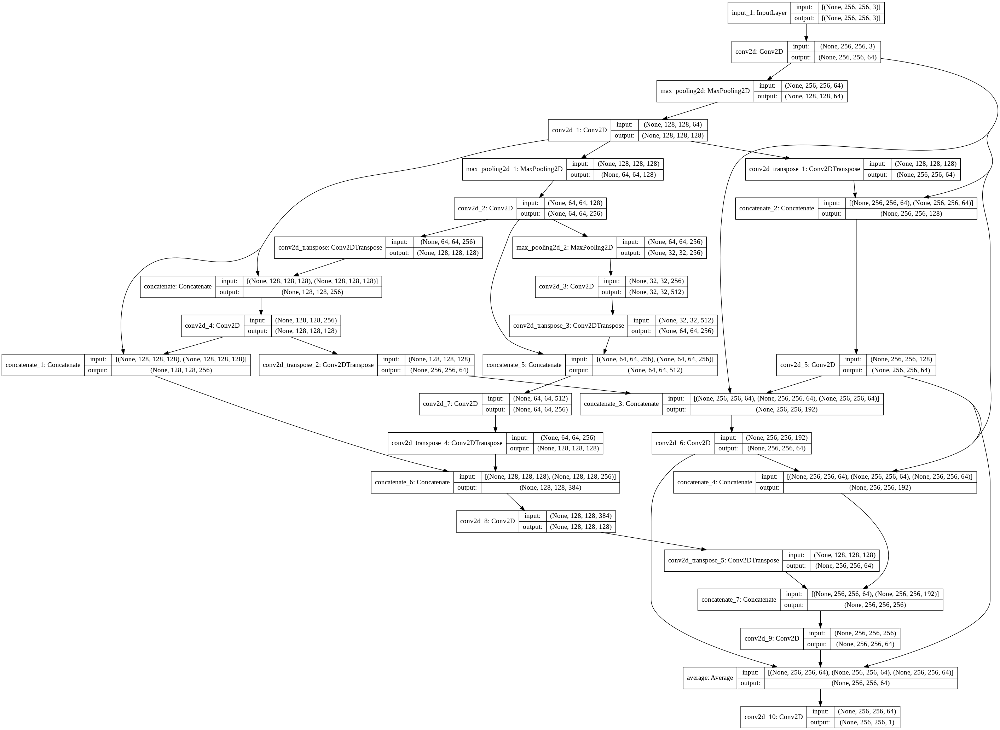

In [ ]:
tf.keras.utils.plot_model(model, 'model_images/unet2_1.png', show_shapes=True)

In [ ]:
%tensorboard --logdir logs/

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
EPOCHS = 1000
STEPS_PER_EPOCH = len(TRAIN_IDS) // BATCH_SIZE
VALIDATION_STEPS = len(VAL_IDS) // BATCH_SIZE

#Compiling
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=[mean_iou_batch], run_eagerly=True) #run_eagerly=True as this enables eager execution
                                                                                                        #and allows tensors to get converted to numpy
                                                                                                        #used in the custom metric mean_iou
#Defining Callbacks
log_dir = 'logs/' + 'unet2_1'
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
earlystopper = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, verbose=2)
checkpointer = tf.keras.callbacks.ModelCheckpoint('models/unet2_1.h5', monitor='val_mean_iou_batch', mode='max', verbose=1, save_best_only=True)

#Training
model_history = model.fit(train_dataset, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=val_dataset,  
                          callbacks=[tensorboard_callback, checkpointer, earlystopper],
                          verbose=1)

In [ ]:
#Loading the best model
dependencies = {'mean_iou_batch':mean_iou_batch}
unet2_1 = tf.keras.models.load_model('models/unet2_1.h5', custom_objects=dependencies)
unet2_1.compile(optimizer='adam', loss='binary_crossentropy', metrics=[mean_iou_batch], run_eagerly=True)

#Evaluation
print('val score:', unet2_1.evaluate(val_dataset, steps=VALIDATION_STEPS))
print('train score:', unet2_1.evaluate(train_dataset, steps=STEPS_PER_EPOCH))

4/4 [==============================] - 18s 247ms/step - loss: 0.1150 - mean_iou_batch: 0.8603
val score: [0.11498045176267624, 0.8602667450904846]
41/41 [==============================] - 11s 252ms/step - loss: 0.0601 - mean_iou_batch: 0.9065
train score: [0.06012986972928047, 0.9065485596656799]


In [ ]:
print('crosschecking val score:', custom_evaluate(unet2_1, val_dataset, VALIDATION_STEPS))

crosschecking val score: 0.8602667899292862


# Compare all the models

In [10]:
def compare_models(sample_ids, models, data='train', figsize=(12,6)):
  X = np.zeros((len(sample_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
  
  if data == 'train' or data == 'val':
    true_masks = np.zeros((len(sample_ids), IMG_HEIGHT, IMG_WIDTH, 1))
    for ind, id in enumerate(sample_ids):
      img = resize(get_id_image(id, data), (IMG_HEIGHT, IMG_WIDTH))[:,:,:IMG_CHANNELS]
      mask = resize(get_id_mask(id, data), (IMG_HEIGHT, IMG_WIDTH))
      #masks to binary
      mask = np.round(mask)
      X[ind] = img
      true_masks[ind] = mask[:,:,np.newaxis]
    pred_masks_list = []
    for modl in models:
      pred_masks_list.append(np.round(modl.predict(X)))
    for i in range(len(sample_ids)):
      print(sample_ids[i])
      fig, axes = plt.subplots(1, len(models)+2, figsize=figsize)
      ax = axes.ravel()
      ax[0].imshow(X[i])
      ax[0].set_title('image')
      ax[1].imshow(true_masks[i][:,:,0], cmap='gray')
      ax[1].set_title('true mask')
      for m in range(len(models)):
        ax[m+2].imshow(pred_masks_list[m][i][:,:,0], cmap='gray')
        ax[m+2].set_title(mean_iou_single(true_masks[i], pred_masks_list[m][i]))    
      fig.tight_layout()
      plt.show()

  if data == 'test':
    for ind, id in enumerate(sample_ids):
      img = resize(get_id_image(id, 'test'), (IMG_HEIGHT, IMG_WIDTH))[:,:,:IMG_CHANNELS]
      X[ind] = img
    pred_masks_list = []
    for modl in models:
      pred_masks_list.append(np.round(modl.predict(X)))
    for i in range(len(sample_ids)):
      print(sample_ids[i])
      fig, axes = plt.subplots(1, len(models)+1, figsize=figsize)
      ax = axes.ravel()
      ax[0].imshow(X[i])
      ax[0].set_title('image')
      for m in range(len(models)):
        ax[m+1].imshow(pred_masks_list[m][i][:,:,0], cmap='gray')   
      fig.tight_layout()
      plt.show()

**EVALUATION**

In [15]:
#Loading the best model
dependencies = {'mean_iou_batch':mean_iou_batch}

unet_1 = tf.keras.models.load_model('models/unet_1.h5', custom_objects=dependencies)
unet_1.compile(optimizer='adam', loss='binary_crossentropy', metrics=[mean_iou_batch], run_eagerly=True)

unet_2 = tf.keras.models.load_model('models/unet_2.h5', custom_objects=dependencies)
unet_2.compile(optimizer='adam', loss='binary_crossentropy', metrics=[mean_iou_batch], run_eagerly=True)

unet_3 = tf.keras.models.load_model('models/unet_3.h5', custom_objects=dependencies)
unet_3.compile(optimizer='adam', loss='binary_crossentropy', metrics=[mean_iou_batch], run_eagerly=True)

hrnet = tf.keras.models.load_model('models/hrnet.h5', custom_objects=dependencies)
hrnet.compile(optimizer='adam', loss='binary_crossentropy', metrics=[mean_iou_batch], run_eagerly=True)

unet2_1 = tf.keras.models.load_model('models/unet2_1.h5', custom_objects=dependencies)
unet2_1.compile(optimizer='adam', loss='binary_crossentropy', metrics=[mean_iou_batch], run_eagerly=True)

In [18]:
VALIDATION_STEPS = len(VAL_IDS) // BATCH_SIZE
STEPS_PER_EPOCH = len(TRAIN_IDS) // BATCH_SIZE

#Evaluation
print('*'*50)
print('unet_1')
print('val score:', unet_1.evaluate(val_dataset, steps=VALIDATION_STEPS, verbose=0))
print('train score:', unet_1.evaluate(train_dataset, steps=STEPS_PER_EPOCH, verbose=0))

print('*'*50)
print('unet_2')
print('val score:', unet_2.evaluate(val_dataset, steps=VALIDATION_STEPS, verbose=0))
print('train score:', unet_2.evaluate(train_dataset, steps=STEPS_PER_EPOCH, verbose=0))

print('*'*50)
print('unet_3')
print('val score:', unet_3.evaluate(val_dataset, steps=VALIDATION_STEPS, verbose=0))
print('train score:', unet_3.evaluate(train_dataset, steps=STEPS_PER_EPOCH, verbose=0))

print('*'*50)
print('hrnet')
print('val score:', hrnet.evaluate(val_dataset, steps=VALIDATION_STEPS, verbose=0))
print('train score:', hrnet.evaluate(train_dataset, steps=STEPS_PER_EPOCH, verbose=0))

print('*'*50)
print('unet2_1')
print('val score:', unet2_1.evaluate(val_dataset, steps=VALIDATION_STEPS, verbose=0))
print('train score:', unet2_1.evaluate(train_dataset, steps=STEPS_PER_EPOCH, verbose=0))

**************************************************
unet_1
val score: [0.10983511060476303, 0.8609639406204224]
train score: [0.05772559717297554, 0.9095036387443542]
**************************************************
unet_2
val score: [0.14998161792755127, 0.8314290046691895]
train score: [0.06881291419267654, 0.8990261554718018]
**************************************************
unet_3
val score: [0.12592557072639465, 0.8431540131568909]
train score: [0.06098812445998192, 0.904241681098938]
**************************************************
hrnet
val score: [0.12577807903289795, 0.8497031331062317]
train score: [0.05503208562731743, 0.9078352451324463]
**************************************************
unet2_1
val score: [0.11498044431209564, 0.8602667450904846]
train score: [0.060384541749954224, 0.9060103297233582]


**MANUAL INSPECTION**

In [19]:
sample_train_ids = ['3594684b9ea0e16196f498815508f8d364d55fea2933a2e782122b6f00375d04','50a7ea80dd73232a17f98b5c83f62ec89989e892fe25b79b36f99b3872a7d182', '337b6eed0726f07531cd467cd62b6676c31a8c9e716bdbc49433986c022252cf', '04acab7636c4cf61d288a5962f15fa456b7bde31a021e5deedfbf51288e4001e', '8e8a7a14749d0b2e48de3d10e2e80063f17b165ad921c8afc0623f08500f3259', 'f952cc65376009cfad8249e53b9b2c0daaa3553e897096337d143c625c2df886']
sample_val_ids = ['0999dab07b11bc85fb8464fc36c947fbd8b5d6ec49817361cb780659ca805eac','0a849e0eb15faa8a6d7329c3dd66aabe9a294cccb52ed30a90c8ca99092ae732','0f1f896d9ae5a04752d3239c690402c022db4d72c0d2c087d73380896f72c466', '17b9bf4356db24967c4677b8376ac38f826de73a88b93a8d73a8b452e399cdff', '1962d0c5faf3e85cda80e0578e0cb7aca50826d781620e5c1c4cc586bc69f81a', '1d9eacb3161f1e2b45550389ecf7c535c7199c6b44b1c6a46303f7b965e508f1','3c4c675825f7509877bc10497f498c9a2e3433bf922bd870914a2eb21a54fd26', '472b1c5ff988dadc209faea92499bc07f305208dbda29d16262b3d543ac91c71']
sample_test_ids = ['dbd9dce0aed27ec69f7a47c8b715ad52e1dad472d82f9bf050470007dc1af94e','25ae6da0f1ced38fc87aff6fad90f9980062fa4d18161904364f5b95a20422a4','580fb557444d914797839fadecc9d6d60aa7c2eb98e854bafa014b3a13d27ddd','e0480625325c11f096d540a8cda158397095e0efa287fe7b0658477566ee48c8','a7e5aa0e0b11c89f436dfebd2a1343739a69d065b3f78a0a11fdb65afd6f7457', '861a0fa08ceacdc6372728920d313a9b80257086e8e733e92d9c18c257ec9e93', '2fa8719a414b802474497eb5b3261f2e3903a75ec21534ffca674e1555072519', 'ce5176e721adba76663e9bdcc47c3ba0c70110573da99cf314a38d7eea070680', '20d0d2ac8ecc95216d056b46163466a18b7f74c921e9f2b5e46e538a58de65e6', '1028160a0e29d080fff27b2d8a119938fa8dbc86b1c88c3ea452b048191e1d79','f3a512375cbe51d56efeb8a644923cf884eb23c06810f0218407c74225d83eab', 'e90773e64b055d3ea09210c5f9803dba7126a717dc0baece319d2c9505e363c5']

3594684b9ea0e16196f498815508f8d364d55fea2933a2e782122b6f00375d04


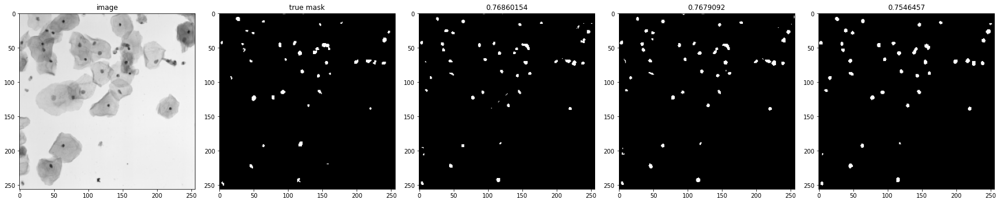

50a7ea80dd73232a17f98b5c83f62ec89989e892fe25b79b36f99b3872a7d182


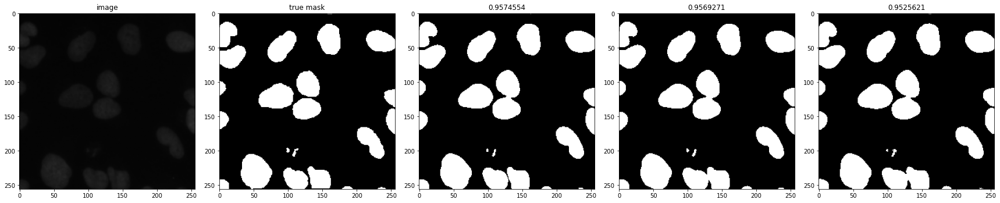

337b6eed0726f07531cd467cd62b6676c31a8c9e716bdbc49433986c022252cf


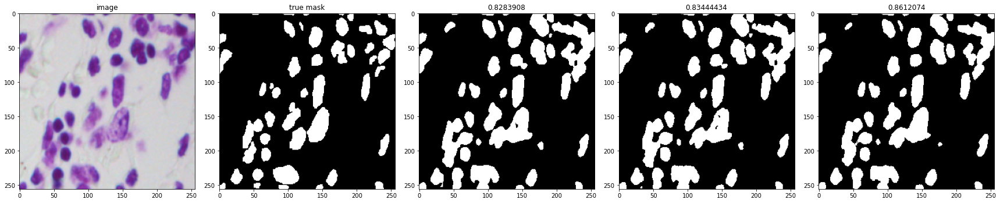

04acab7636c4cf61d288a5962f15fa456b7bde31a021e5deedfbf51288e4001e


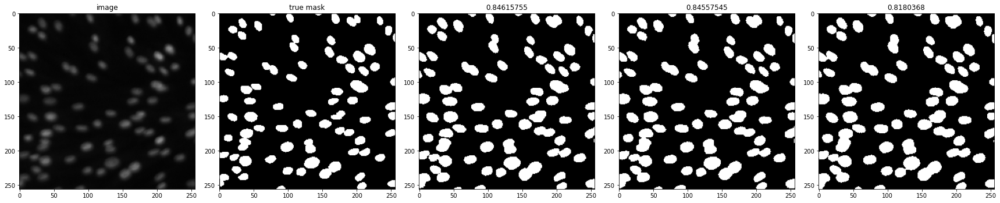

8e8a7a14749d0b2e48de3d10e2e80063f17b165ad921c8afc0623f08500f3259


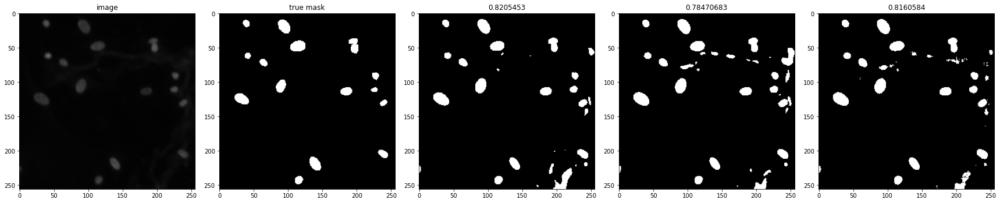

f952cc65376009cfad8249e53b9b2c0daaa3553e897096337d143c625c2df886


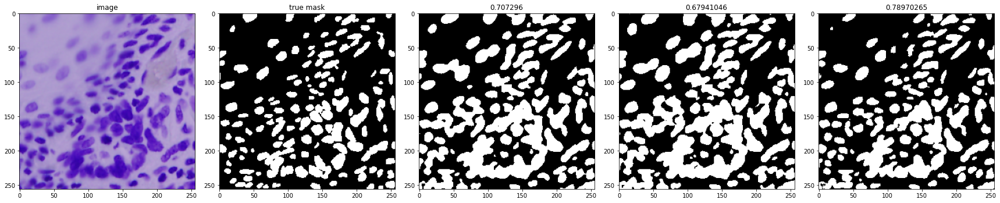

In [20]:
compare_models(sample_train_ids, [unet_1, unet2_1, hrnet], 'train', (24,8))

In [21]:
compare_models(sample_val_ids, [unet_1, unet2_1, hrnet], 'val', (24,8))

Output hidden; open in https://colab.research.google.com to view.

In [22]:
compare_models(sample_test_ids, [unet_1, unet2_1, hrnet], 'test', (24,8))

Output hidden; open in https://colab.research.google.com to view.